In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile
import matplotlib.colors as mcolors
import os
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry
import torch
import pickle
from tqdm import tqdm
import napari
import pandas as pd
from skimage.measure import label as skimage_label, regionprops_table
import torch
import cv2
from segment_anything import sam_model_registry, SamPredictor

In [2]:
## Load the model

# Define the path
checkpoint_path = os.path.join(os.getcwd(), "sam_vit_h_4b8939.pth")

# Initialize the model without loading the checkpoint
sam = sam_model_registry["default"](checkpoint=None)

# Load the state dictionary with weights_only=True
state_dict = torch.load(checkpoint_path, weights_only=True)

predictor = SamPredictor(sam)

# Load the state dictionary into the model
sam.load_state_dict(state_dict)

<All keys matched successfully>

In [3]:
def process_slice(slice_2d, sam):
    """Process a 2D image slice for segmentation using SAM.

    Args:
        slice_2d (numpy.ndarray): A 2D grayscale or RGB image slice.
        sam: Preloaded SAM model.

    Returns:
        list: A list of generated masks with large masks filtered out.
    """

    # Ensure the slice is RGB if it's grayscale
    if slice_2d.ndim == 2:
        slice_2d = np.stack((slice_2d,) * 3, axis=-1)  # Convert grayscale to RGB

    # Normalize and convert to uint8 if necessary
    if slice_2d.dtype == np.uint16:
        slice_2d = (slice_2d / 256).astype(np.uint8)

    # Initialize the SAM mask generator
    mask_generator = SamAutomaticMaskGenerator(
        model=sam,
        points_per_side=80,
        pred_iou_thresh=0.85,
        stability_score_thresh=0.97,
        crop_n_layers=0,
        crop_n_points_downscale_factor=1,
        min_mask_region_area=0,
    )

    # Generate masks
    masks = mask_generator.generate(slice_2d)

    # Filter out masks with an area greater than 5% of the total image area
    total_area = slice_2d.shape[0] * slice_2d.shape[1]
    masks = [mask for mask in masks if mask['area'] <= 0.05 * total_area]

    return masks


## SAM Segmentation in nuclei channel 

In [4]:
# Construct the relative path to the TIFF file
nuclei_relative_path = os.path.join(os.getcwd(), 'Embryo1', 'Emb1_C1_nuclei.tif')

# Load the 3D TIFF file
nuclei_3d = tifffile.imread(nuclei_relative_path)

# Check the shape of the TIFF file (should be 3D)
print("Shape of the TIFF image:", nuclei_3d.shape)

Shape of the TIFF image: (24, 1024, 1024)


In [23]:
masks_per_slice_nuclei_1 = []

for i in tqdm(range(nuclei_3d.shape[0]), desc="Processing "):
    slice_2d = nuclei_3d[i, :, :]
    masks = process_slice(slice_2d, sam)
    masks_per_slice_nuclei_1.append(masks)


Processing : 100%|███████████████████████████| 24/24 [2:02:23<00:00, 305.96s/it]


In [26]:
# Define the output file path in the current directory
output_file = os.path.join(os.getcwd(), 'masks_per_slice_nuclei_1.pkl')

# Save masks to the file
with open(output_file, 'wb') as file:
    pickle.dump(masks_per_slice_nuclei_1, file)

print(f"Saved masks_per_slice_nuclei_1 successfully")

Saved masks_per_slice_nuclei_1 successfully


In [5]:
# Define the file path
file_path = os.path.join(os.getcwd(), 'masks_per_slice_nuclei_1.pkl')

# Load the masks from the file
with open(file_path, 'rb') as file:
    masks_per_slice_nuclei_1 = pickle.load(file)

# Print confirmation
print("Masks successfully loaded.")

Masks successfully loaded.


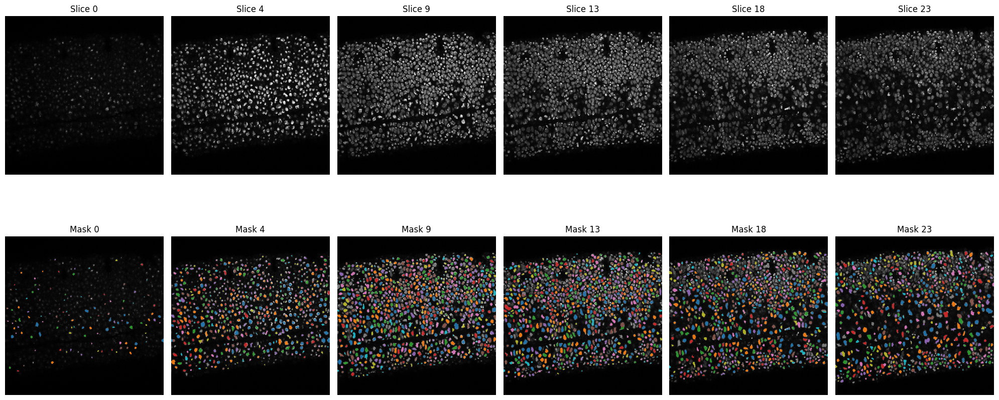

In [6]:
# Select 6 evenly spaced slices from the 3D image
num_slices = nuclei_3d.shape[0]
num_selected = 6  # Number of slices to select
selected_indices = np.linspace(0, num_slices - 1, num_selected, dtype=int)

# Create a 2-row, 6-column plot layout
fig, axs = plt.subplots(2, num_selected, figsize=(20, 10))

for i, j in enumerate(selected_indices):
    slice_2d = nuclei_3d[j, :, :]

    # Plot the original slice in the first row
    axs[0, i].imshow(slice_2d, cmap='gray')
    axs[0, i].set_title(f"Slice {j}")
    axs[0, i].axis('off')

    # If there are no masks, leave the second row blank
    if not masks_per_slice_nuclei_1[j]:
        axs[1, i].axis('off')
        continue

    # Initialize a blank mask image
    mask_shape = masks_per_slice_nuclei_1[j][0]['segmentation'].shape
    combined_mask = np.zeros(mask_shape, dtype=np.uint16)

    # Assign unique values to each mask
    for k, mask in enumerate(masks_per_slice_nuclei_1[j]):
        combined_mask[mask['segmentation']] = k + 1

    # Correct colormap usage
    num_masks = len(masks_per_slice_nuclei_1[j])
    cmap = plt.colormaps['tab10']  # Proper colormap retrieval
    cmap = cmap(np.linspace(0, 1, num_masks + 1))  # Generate correct number of colors

    # Create a ListedColormap to apply transparency to background
    new_cmap = mcolors.ListedColormap(cmap)
    new_cmap.set_under(color='none')  # Make background transparent

    # Mask out zero values
    masked_combined_mask = np.ma.masked_where(combined_mask == 0, combined_mask)

    # Plot the mask in the second row
    axs[1, i].imshow(slice_2d, cmap='gray')
    axs[1, i].imshow(masked_combined_mask, cmap=new_cmap,
                     norm=mcolors.BoundaryNorm(np.arange(num_masks + 2) - 0.5, num_masks + 1),
                     alpha=0.9)  # Overlay the masks
    axs[1, i].set_title(f"Mask {j}")
    axs[1, i].axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()


## SAM Segmentation in membrane channel

In [7]:
# Construct the relative path to the TIFF file
membrane_relative_path = os.path.join(os.getcwd(), 'Embryo1', 'Emb1_C2_membrane.tif')

# Load the 3D TIFF file
membrane_3d = tifffile.imread(membrane_relative_path)

# Check the shape of the TIFF file (should be 3D)
print("Shape of the TIFF image:", membrane_3d.shape)

Shape of the TIFF image: (24, 1024, 1024)


In [31]:
masks_per_slice_membrane_1 = []

for i in tqdm(range(membrane_3d.shape[0]), desc="Processing "):
    slice_2d = membrane_3d[i, :, :]
    masks = process_slice(slice_2d, sam)
    masks_per_slice_membrane_1.append(masks)


Processing : 100%|███████████████████████████| 24/24 [1:14:09<00:00, 185.38s/it]


In [32]:
# Define the output file path in the current directory
output_file = os.path.join(os.getcwd(), 'masks_per_slice_membrane_1.pkl')

# Save masks to the file
with open(output_file, 'wb') as file:
    pickle.dump(masks_per_slice_membrane_1, file)

print(f"Saved masks_per_slice_membrane_1 successfully")

Saved masks_per_slice_membrane_1 successfully


In [8]:
# Define the file path
file_path = os.path.join(os.getcwd(), 'masks_per_slice_membrane_1.pkl')

# Load the masks from the file
with open(file_path, 'rb') as file:
    masks_per_slice_membrane_1 = pickle.load(file)

# Print confirmation
print("Masks successfully loaded.")

Masks successfully loaded.


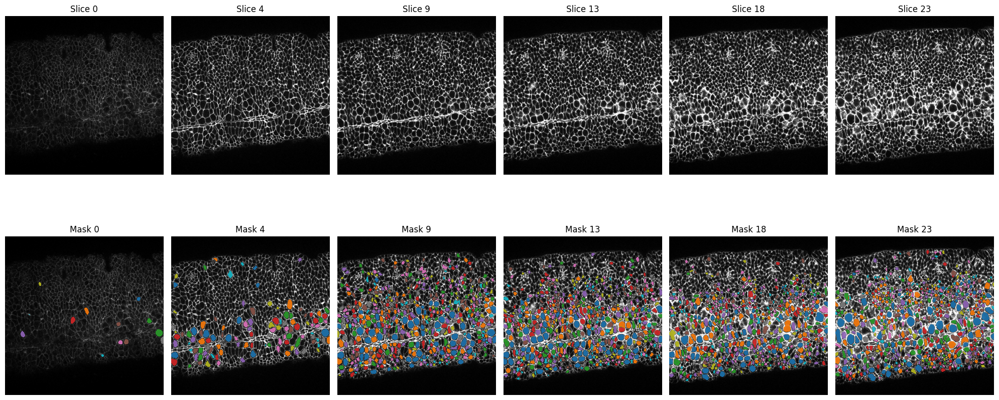

In [9]:
# Select 6 evenly spaced slices from the 3D image
num_slices = membrane_3d.shape[0]
num_selected = 6  # Number of slices to select
selected_indices = np.linspace(0, num_slices - 1, num_selected, dtype=int)

# Create a 2-row, 6-column plot layout
fig, axs = plt.subplots(2, num_selected, figsize=(20, 10))

for i, j in enumerate(selected_indices):
    slice_2d = membrane_3d[j, :, :]

    # Plot the original slice in the first row
    axs[0, i].imshow(slice_2d, cmap='gray')
    axs[0, i].set_title(f"Slice {j}")
    axs[0, i].axis('off')

    # If there are no masks, leave the second row blank
    if not masks_per_slice_membrane_1[j]:
        axs[1, i].axis('off')
        continue

    # Initialize a blank mask image
    mask_shape = masks_per_slice_membrane_1[j][0]['segmentation'].shape
    combined_mask = np.zeros(mask_shape, dtype=np.uint16)

    # Assign unique values to each mask
    for k, mask in enumerate(masks_per_slice_membrane_1[j]):
        combined_mask[mask['segmentation']] = k + 1

    # Correct colormap usage
    num_masks = len(masks_per_slice_membrane_1[j])
    cmap = plt.colormaps['tab10']  # Proper colormap retrieval
    cmap = cmap(np.linspace(0, 1, num_masks + 1))  # Generate correct number of colors

    # Create a ListedColormap to apply transparency to background
    new_cmap = mcolors.ListedColormap(cmap)
    new_cmap.set_under(color='none')  # Make background transparent

    # Mask out zero values
    masked_combined_mask = np.ma.masked_where(combined_mask == 0, combined_mask)

    # Plot the mask in the second row
    axs[1, i].imshow(slice_2d, cmap='gray')
    axs[1, i].imshow(masked_combined_mask, cmap=new_cmap,
                     norm=mcolors.BoundaryNorm(np.arange(num_masks + 2) - 0.5, num_masks + 1),
                     alpha=0.9)  # Overlay the masks
    axs[1, i].set_title(f"Mask {j}")
    axs[1, i].axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()


## SAM Segmentation in nuclei channel --> centroid as prompts to segment membrane channel 

In [10]:
# Define the slice index
slice_index = 12

# Extract slice 12 for both nuclei and membrane channels
nuclei_slice = nuclei_3d[slice_index, :, :]
membrane_slice = membrane_3d[slice_index, :, :]

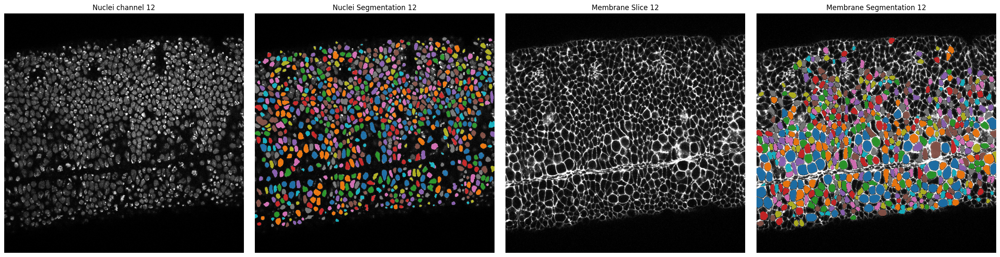

In [11]:
# Create a 1-row, 4-column subplot layout
fig, axs = plt.subplots(1, 4, figsize=(24, 6))

# ==== Plot Nuclei Channel (Original + Segmentation) ====
# Plot original nuclei slice
axs[0].imshow(nuclei_slice, cmap='gray')
axs[0].set_title(f"Nuclei channel {slice_index}")
axs[0].axis('off')

# Generate nuclei segmentation mask
if masks_per_slice_nuclei_1[slice_index]:
    nuclei_mask_shape = masks_per_slice_nuclei_1[slice_index][0]['segmentation'].shape
    nuclei_combined_mask = np.zeros(nuclei_mask_shape, dtype=np.uint16)

    for k, mask in enumerate(masks_per_slice_nuclei_1[slice_index]):
        nuclei_combined_mask[mask['segmentation']] = k + 1

    num_nuclei_masks = len(masks_per_slice_nuclei_1[slice_index])
    cmap_nuclei = plt.colormaps['tab10'](np.linspace(0, 1, num_nuclei_masks + 1))
    cmap_nuclei = mcolors.ListedColormap(cmap_nuclei)
    cmap_nuclei.set_under(color='none')

    masked_nuclei_mask = np.ma.masked_where(nuclei_combined_mask == 0, nuclei_combined_mask)

    axs[1].imshow(nuclei_slice, cmap='gray')
    axs[1].imshow(masked_nuclei_mask, cmap=cmap_nuclei,
                  norm=mcolors.BoundaryNorm(np.arange(num_nuclei_masks + 2) - 0.5, num_nuclei_masks + 1),
                  alpha=0.9)
    axs[1].set_title(f"Nuclei Segmentation {slice_index}")
    axs[1].axis('off')
else:
    axs[1].axis('off')

# ==== Plot Membrane Channel (Original + Segmentation) ====
# Plot original membrane slice
axs[2].imshow(membrane_slice, cmap='gray')
axs[2].set_title(f"Membrane Slice {slice_index}")
axs[2].axis('off')

# Generate membrane segmentation mask
if masks_per_slice_membrane_1[slice_index]:
    membrane_mask_shape = masks_per_slice_membrane_1[slice_index][0]['segmentation'].shape
    membrane_combined_mask = np.zeros(membrane_mask_shape, dtype=np.uint16)

    for k, mask in enumerate(masks_per_slice_membrane_1[slice_index]):
        membrane_combined_mask[mask['segmentation']] = k + 1

    num_membrane_masks = len(masks_per_slice_membrane_1[slice_index])
    cmap_membrane = plt.colormaps['tab10'](np.linspace(0, 1, num_membrane_masks + 1))
    cmap_membrane = mcolors.ListedColormap(cmap_membrane)
    cmap_membrane.set_under(color='none')

    masked_membrane_mask = np.ma.masked_where(membrane_combined_mask == 0, membrane_combined_mask)

    axs[3].imshow(membrane_slice, cmap='gray')
    axs[3].imshow(masked_membrane_mask, cmap=cmap_membrane,
                  norm=mcolors.BoundaryNorm(np.arange(num_membrane_masks + 2) - 0.5, num_membrane_masks + 1),
                  alpha=0.9)
    axs[3].set_title(f"Membrane Segmentation {slice_index}")
    axs[3].axis('off')
else:
    axs[3].axis('off')


# Adjust layout and display
plt.tight_layout()
plt.show()


In [12]:
# Define the slice index
slice_index = 12

# Extract the 12th slice from the 3D nuclei image
nuclei_2d = nuclei_3d[slice_index, :, :]
masks = masks_per_slice_nuclei_1[slice_index]

# Initialize the combined mask with a larger data type for labeling
combined_mask = np.zeros_like(nuclei_2d, dtype=np.uint16)

# Assign unique labels to each mask region
for j, mask in enumerate(masks):
    combined_mask[mask['segmentation']] = j + 1

# Label the mask for region analysis
labeled_mask = skimage_label(combined_mask)

# Extract properties (label and centroid) for each region
regionprops_df = pd.DataFrame(regionprops_table(labeled_mask, properties=['label', 'centroid']))

# Add a 'frame' column for the current slice index
regionprops_df['frame'] = slice_index

# Convert centroids to a structured format
centroids_12th_slice = regionprops_df[['centroid-0', 'centroid-1']].copy()
centroids_12th_slice.insert(0, 'frame', slice_index)  # Add frame column at the beginning

# Convert to a DataFrame
centroids_df_12th_slice = centroids_12th_slice.rename(columns={'centroid-0': 'y', 'centroid-1': 'x'})

# Display results
print("Centroids from nuclei segmentation for the 12th slice:")
centroids_df_12th_slice

Centroids from nuclei segmentation for the 12th slice:


,frame,y,x
0,12,108.406977,810.000000
1,12,110.924812,751.834586
2,12,109.839286,954.482143
3,12,112.780952,1005.323810
4,12,118.785425,627.854251
...,...,...,...
843,12,894.778210,169.599222
844,12,900.108772,18.192982
845,12,900.797571,121.927126
846,12,903.759259,138.555556


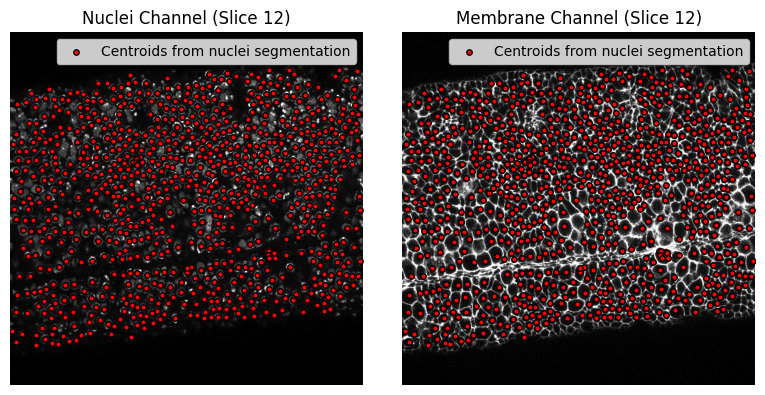

In [13]:
# Create a 1x2 subplot
fig, axs = plt.subplots(1, 2, figsize=(8, 4))

# Plot on Nuclei Channel (left)
axs[0].imshow(nuclei_3d[slice_index], cmap='gray')
axs[0].scatter(centroids_df_12th_slice['x'], centroids_df_12th_slice['y'], 
               color='red', s=15, marker='o', edgecolors='black', label='Centroids from nuclei segmentation')
axs[0].set_title(f"Nuclei Channel (Slice {slice_index})")
axs[0].axis('off')
axs[0].legend()

# Plot on Membrane Channel (right)
axs[1].imshow(membrane_slice, cmap='gray')
axs[1].scatter(centroids_df_12th_slice['x'], centroids_df_12th_slice['y'], 
               color='red', s=15, marker='o', edgecolors='black', label='Centroids from nuclei segmentation')
axs[1].set_title(f"Membrane Channel (Slice {slice_index})")
axs[1].axis('off')
axs[1].legend()

# Adjust layout and show
plt.tight_layout()
plt.show()

In [14]:
# Convert grayscale membrane slice to RGB
membrane_slice_rgb = np.stack([membrane_slice] * 3, axis=-1)  # Convert (H, W) -> (H, W, 3)

# Set the RGB image in the predictor before segmentation
predictor.set_image(membrane_slice_rgb)  # Ensure correct input format


In [15]:
# Extract and transpose centroids for plotting
centroids_y = centroids_df_12th_slice['y'].values  # Y coordinates
centroids_x = centroids_df_12th_slice['x'].values  # X coordinates

# Combine Y and X into points
centroids_points = np.column_stack((centroids_x, centroids_y))

# Initialize an empty mask to store the labeled masks
labeled_mask = np.zeros_like(membrane_slice, dtype=np.uint16)

# Iterate through each centroid point to generate and label masks
for idx, point in enumerate(centroids_points):
    input_point = np.array([point])
    input_label = np.array([1])  # Define a label for the predictor

    # Predict masks for the given centroid point
    masks, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=True,
    )
    
    # Assign a unique label to each mask
    mask_label = idx + 1
    labeled_mask[masks[0].astype(bool)] = mask_label


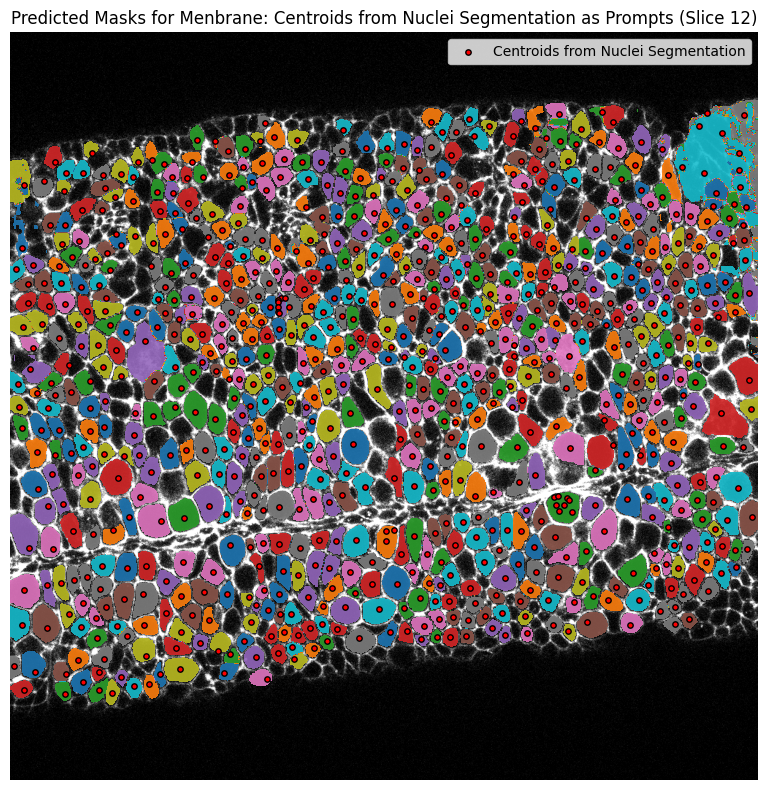

In [17]:
# Create a figure with a single subplot
fig, ax = plt.subplots(figsize=(8, 8))

# Plot the original membrane slice in grayscale
ax.imshow(membrane_slice, cmap='gray')

# Ensure neighboring regions get different colors
num_labels = len(centroids_points)
if num_labels > 0:
    # Use a colormap with more unique colors
    cmap_colors = plt.colormaps['tab10'](np.linspace(0, 1, num_labels + 1))  # More distinct colors

    # Randomize color order to prevent adjacent regions from sharing similar hues
    np.random.shuffle(cmap_colors)

    # Convert to a ListedColormap
    cmap_membrane = mcolors.ListedColormap(cmap_colors)
    cmap_membrane.set_under(color='none')  # Make background transparent

    # Mask out zero values for proper overlay
    masked_labeled_mask = np.ma.masked_where(labeled_mask == 0, labeled_mask)

    ax.imshow(masked_labeled_mask, cmap=cmap_membrane,
              norm=mcolors.BoundaryNorm(np.arange(num_labels + 2) - 0.5, num_labels + 1),
              alpha=0.9)  # Adjust transparency for better overlay

# Plot centroids as red dots
ax.scatter(centroids_x, centroids_y, color='red', s=15, marker='o', edgecolors='black', label='Centroids from Nuclei Segmentation')

# Add title and legend
ax.set_title(f"Predicted Masks for Menbrane: Centroids from Nuclei Segmentation as Prompts (Slice {slice_index})")
ax.axis('off')  # Hide axis
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()


## MicroSAM in membrane channel

In [18]:
# Construct the relative path to the TIFF file
microsam_relative_path = os.path.join(os.getcwd(), 'Embryo1', 'Emb1_membrane_masks.tif')

# Load the 3D TIFF file
microsam_3d = tifffile.imread(microsam_relative_path)

# Check the shape of the TIFF file (should be 3D)
print("Shape of the TIFF image:", microsam_3d.shape)

Shape of the TIFF image: (24, 1024, 1024)


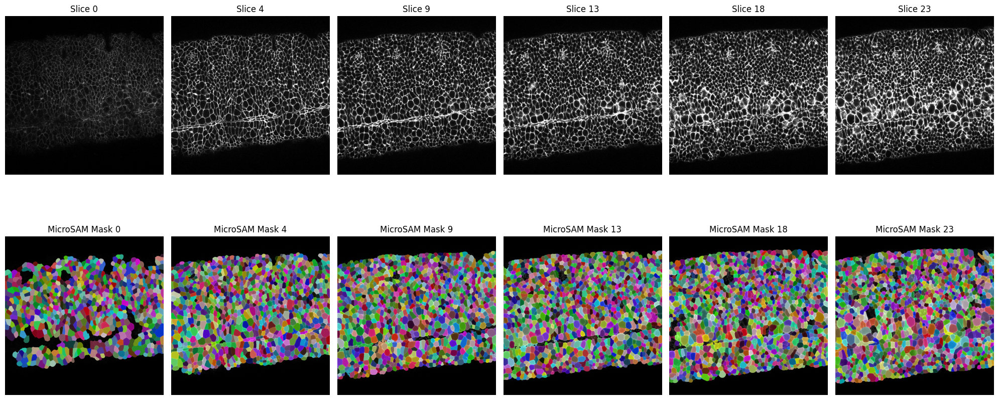

In [19]:
# Select 6 evenly spaced slices from the 3D TIFF image
num_slices = microsam_3d.shape[0]
num_selected = 6  # Number of slices to select
selected_indices = np.linspace(0, num_slices - 1, num_selected, dtype=int)

# Create a 2-row, 6-column plot layout
fig, axs = plt.subplots(2, num_selected, figsize=(20, 10))

for i, j in enumerate(selected_indices):
    slice_2d = membrane_3d[j, :, :]  # Extract the membrane slice
    mask_2d = microsam_3d[j, :, :]  # Extract the corresponding segmentation mask

    # ===== First row: Original Membrane Slice =====
    axs[0, i].imshow(slice_2d, cmap='gray')
    axs[0, i].set_title(f"Slice {j}")
    axs[0, i].axis('off')

    # ===== Second row: Mask Overlay on Membrane Slice =====
    axs[1, i].imshow(slice_2d, cmap='gray')  # Show background membrane slice

    unique_labels = np.unique(mask_2d)
    unique_labels = unique_labels[unique_labels > 0]  # Remove background (0)
    num_masks = len(unique_labels)

    if num_masks > 0:
        # Generate unique random colors for each label
        np.random.seed(42)  # Set seed for reproducibility
        random_colors = np.random.rand(num_masks, 3)  # Generate RGB colors

        # Create a dictionary mapping each label to a unique color
        label_to_color = {label: random_colors[i] for i, label in enumerate(unique_labels)}

        # Create a colored image
        mask_rgb = np.zeros((*mask_2d.shape, 3))  # Create an empty RGB image
        for label, color in label_to_color.items():
            mask_rgb[mask_2d == label] = color  # Assign each region a unique color

        axs[1, i].imshow(mask_rgb, alpha=0.8)  # Overlay with transparency

    axs[1, i].set_title(f"MicroSAM Mask {j}")
    axs[1, i].axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()